# Detection de Pneumonie par Radiographie Thoracique



**Projet complet — Du Machine Learning classique au Deep Learning**

> *"On veut construire une IA qui regarde une radiographie et predit si elle correspond a un patient **Normal** ou **Pneumonia**. On commence par comprendre les images, puis le ML classique, les CNN, et enfin le Transfer Learning comme en entreprise."*



## Table des matieres

| Partie | Contenu |
|--------|---------|
| **A** | Setup & Exploration des donnees (EDA) |
| **B** | Preparation des images — Comprendre chaque transformation |
| **C** | Regression Logistique — Le Machine Learning classique |
| **D** | CNN from scratch — Introduction au Deep Learning |
| **E** | Transfer Learning — Exploiter un modele pre-entraine |
| **F** | Fine-Tuning — Affiner le modele pre-entraine |
| **G** | Comparaison finale & Conclusions |



### Objectifs 

A la fin de ce notebook, vous saurez :

1. **Preparer des images** pour un modele de Computer Vision (grayscale, resize, normalisation, augmentation)
2. Appliquer une **regression logistique** sur des images (approche ML classique)
3. Construire et entrainer un **CNN** (Convolutional Neural Network)
4. Comprendre le **surapprentissage** et les techniques pour le combattre
5. Utiliser le **Transfer Learning** avec un modele pre-entraine
6. Faire du **Fine-Tuning** pour maximiser les performances
7. Evaluer correctement avec accuracy, matrice de confusion, precision/recall




# Partie A — Setup & Exploration des Donnees



## A.1 — Import des librairies


In [1]:
# ============================================================
# IMPORTS
# ============================================================
import os
import random
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter

from PIL import Image, ImageFilter, ImageEnhance, ImageOps
import cv2

from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (
    classification_report, confusion_matrix,
    accuracy_score, roc_auc_score, roc_curve
)
from sklearn.decomposition import PCA

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, models, callbacks
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.preprocessing import image as keras_image

SEED = 42
np.random.seed(SEED)
tf.random.set_seed(SEED)
random.seed(SEED)

plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette("husl")


# ============================================================
# FONCTIONS UTILITAIRES — Filtrer les fichiers images
# ============================================================
VALID_EXTENSIONS = ('.jpeg', '.jpg', '.png', '.bmp', '.tiff', '.tif')

def list_image_files(directory):
    """Liste uniquement les fichiers images valides dans un dossier.
    Exclut .DS_Store, Thumbs.db, et tout fichier cache ou non-image."""
    if not os.path.exists(directory):
        return []
    return sorted([
        f for f in os.listdir(directory)
        if f.lower().endswith(VALID_EXTENSIONS)
        and not f.startswith('.')
        and not f.startswith('__')
    ])

def safe_open_image(path):
    """Ouvre une image en verifiant qu'elle est valide."""
    try:
        img = Image.open(path)
        img.verify()  # Verifie que le fichier est une image valide
        img = Image.open(path)  # Re-ouvrir apres verify()
        return img
    except Exception as e:
        print(f"  [ATTENTION] Image ignoree : {path} ({e})")
        return None

print(f"TensorFlow version : {tf.__version__}")
print(f"GPU disponible : {tf.config.list_physical_devices('GPU')}")


TensorFlow version : 2.17.1
GPU disponible : [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


## A.2 — Definition des chemins et parametres


In [2]:
# ============================================================
# CHEMINS
# ============================================================
BASE_DIR = "data"

if os.path.exists(os.path.join(BASE_DIR, "chest_xray", "train")):
    TRAIN_DIR = os.path.join(BASE_DIR, "chest_xray", "train")
    VAL_DIR   = os.path.join(BASE_DIR, "chest_xray", "val")
    TEST_DIR  = os.path.join(BASE_DIR, "chest_xray", "test")
else:
    TRAIN_DIR = os.path.join(BASE_DIR, "train")
    VAL_DIR   = os.path.join(BASE_DIR, "val")
    TEST_DIR  = os.path.join(BASE_DIR, "test")

print(f"Train : {TRAIN_DIR}")
print(f"Val   : {VAL_DIR}")
print(f"Test  : {TEST_DIR}")

IMG_SIZE   = 224
BATCH_SIZE = 32
CLASSES    = ['NORMAL', 'PNEUMONIA']


Train : data/chest_xray/train
Val   : data/chest_xray/val
Test  : data/chest_xray/test


## A.3 — Exploration des donnees (EDA)


In [3]:
# ============================================================
# COMPTER LES IMAGES PAR SPLIT ET PAR CLASSE
# ============================================================
def count_images(directory):
    counts = {}
    for cls in CLASSES:
        path = os.path.join(directory, cls)
        counts[cls] = len(list_image_files(path))
    return counts

train_counts = count_images(TRAIN_DIR)
val_counts   = count_images(VAL_DIR)
test_counts  = count_images(TEST_DIR)

summary = pd.DataFrame({
    'Train': train_counts, 'Validation': val_counts, 'Test': test_counts
}).T
summary['Total'] = summary.sum(axis=1)

print("=" * 55)
print("REPARTITION DU DATASET")
print("=" * 55)
print(summary.to_string())
print(f"\nTotal general : {summary['Total'].sum()} images")


REPARTITION DU DATASET
            NORMAL  PNEUMONIA  Total
Train         1341       3875   5216
Validation       8          8     16
Test           234        390    624

Total general : 5856 images


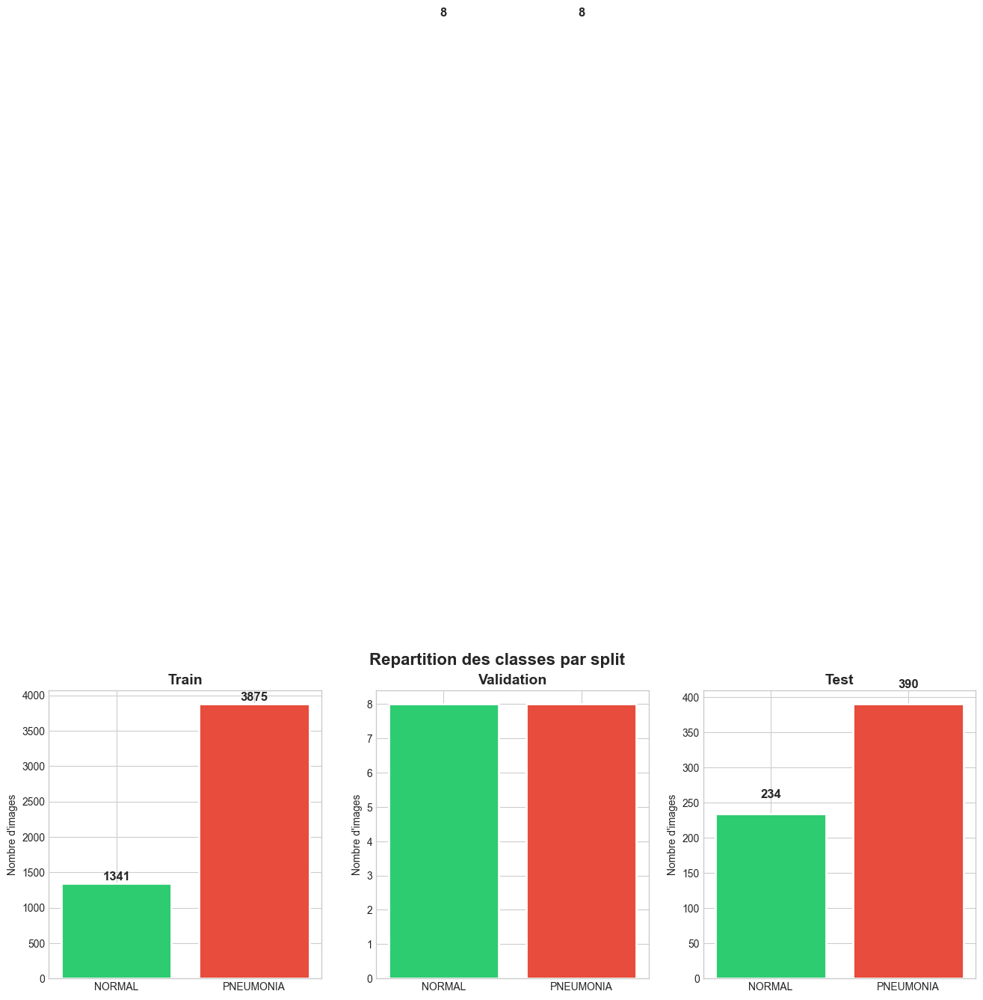


Ratio PNEUMONIA / NORMAL (train) : 2.89
   -> Le dataset est DESEQUILIBRE en faveur de PNEUMONIA


In [4]:
# ============================================================
# VISUALISATION DE LA REPARTITION
# ============================================================
fig, axes = plt.subplots(1, 3, figsize=(16, 5))

for ax, (name, counts) in zip(axes, [
    ('Train', train_counts), ('Validation', val_counts), ('Test', test_counts)
]):
    colors = ['#2ecc71', '#e74c3c']
    bars = ax.bar(counts.keys(), counts.values(), color=colors, edgecolor='white', linewidth=2)
    ax.set_title(f'{name}', fontsize=14, fontweight='bold')
    ax.set_ylabel("Nombre d'images")
    for bar, val in zip(bars, counts.values()):
        ax.text(bar.get_x() + bar.get_width()/2., bar.get_height() + 20,
                str(val), ha='center', va='bottom', fontweight='bold', fontsize=12)

plt.suptitle('Repartition des classes par split', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

ratio = train_counts.get('PNEUMONIA', 0) / max(train_counts.get('NORMAL', 1), 1)
print(f"\nRatio PNEUMONIA / NORMAL (train) : {ratio:.2f}")
if ratio > 1.5:
    print("   -> Le dataset est DESEQUILIBRE en faveur de PNEUMONIA")


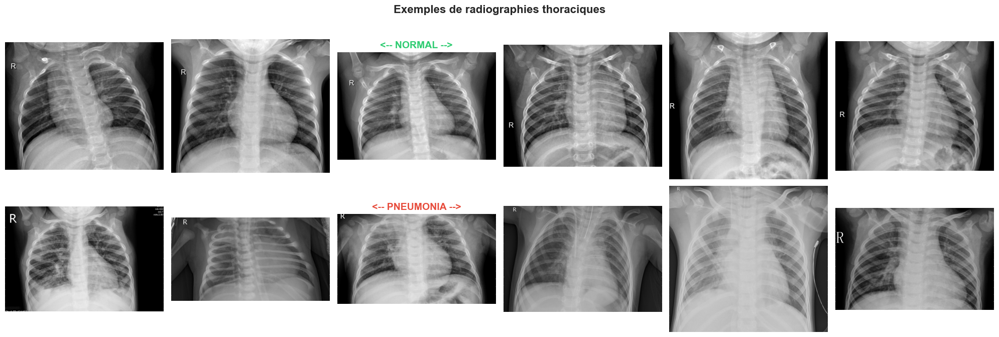

In [5]:
# ============================================================
# VISUALISER DES EXEMPLES D'IMAGES
# ============================================================
fig, axes = plt.subplots(2, 6, figsize=(20, 7))

for row, cls in enumerate(CLASSES):
    cls_dir = os.path.join(TRAIN_DIR, cls)
    images = list_image_files(cls_dir)
    sample = random.sample(images, min(6, len(images)))
    
    for col, img_name in enumerate(sample):
        img_path = os.path.join(cls_dir, img_name)
        img = Image.open(img_path).convert('L')
        axes[row, col].imshow(img, cmap='gray')
        axes[row, col].axis('off')
        if col == 0:
            axes[row, col].set_ylabel(cls, fontsize=14, fontweight='bold',
                                       rotation=0, labelpad=80)

axes[0, 2].set_title('<-- NORMAL -->', fontsize=14, fontweight='bold', color='#2ecc71')
axes[1, 2].set_title('<-- PNEUMONIA -->', fontsize=14, fontweight='bold', color='#e74c3c')
plt.suptitle('Exemples de radiographies thoraciques', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()


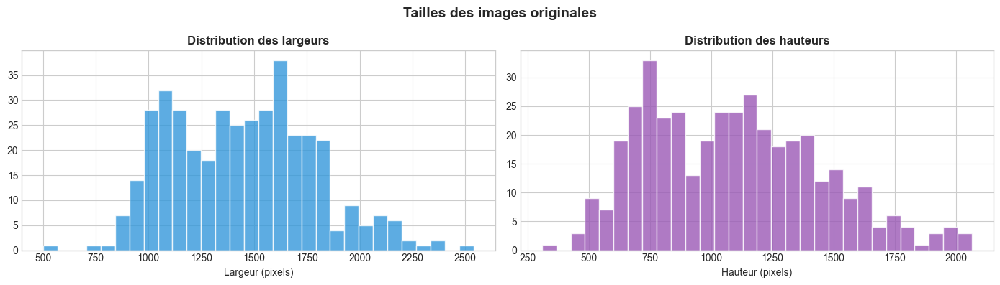

Largeur  -- min: 502, max: 2538, mediane: 1442
Hauteur  -- min: 307, max: 2066, mediane: 1068
Modes    -- Counter({'L': 393, 'RGB': 7})

Les images ont des tailles variees et des modes varies (L=grayscale, RGB=couleur)
-> Il faudra TOUT uniformiser avant de les donner a un modele


In [6]:
# ============================================================
# DISTRIBUTION DES TAILLES D'IMAGES
# ============================================================
widths, heights, channels_list = [], [], []
for cls in CLASSES:
    cls_dir = os.path.join(TRAIN_DIR, cls)
    for img_name in list_image_files(cls_dir)[:200]:
        try:
            img = Image.open(os.path.join(cls_dir, img_name))
            w, h = img.size
            widths.append(w)
            heights.append(h)
            channels_list.append(img.mode)
        except:
            pass

fig, axes = plt.subplots(1, 2, figsize=(14, 4))
axes[0].hist(widths, bins=30, color='#3498db', edgecolor='white', alpha=0.8)
axes[0].set_title('Distribution des largeurs', fontweight='bold')
axes[0].set_xlabel('Largeur (pixels)')
axes[1].hist(heights, bins=30, color='#9b59b6', edgecolor='white', alpha=0.8)
axes[1].set_title('Distribution des hauteurs', fontweight='bold')
axes[1].set_xlabel('Hauteur (pixels)')
plt.suptitle('Tailles des images originales', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

print(f"Largeur  -- min: {min(widths)}, max: {max(widths)}, mediane: {np.median(widths):.0f}")
print(f"Hauteur  -- min: {min(heights)}, max: {max(heights)}, mediane: {np.median(heights):.0f}")
print(f"Modes    -- {Counter(channels_list)}")
print(f"\nLes images ont des tailles variees et des modes varies (L=grayscale, RGB=couleur)")
print(f"-> Il faudra TOUT uniformiser avant de les donner a un modele")




# Partie B — Preparation des Images (Data Preprocessing)



## B.1 —  Pourquoi preparer les images ?

### Le probleme

| Probleme | Detail | Impact |
|----------|--------|--------|
| **Tailles differentes** | 400x300, 1024x1024, 600x800... | Un modele attend une taille fixe |
| **Modes differents** | Grayscale (1 canal), RGB (3 canaux) | Le nombre de features doit etre coherent |
| **Valeurs brutes** | Pixels entre 0 et 255 (entiers) | Les reseaux de neurones preferent des petites valeurs |
| **Peu de donnees** | Quelques milliers d'images | Risque de surapprentissage |
| **Bruit / artefacts** | Annotations, bords noirs, variations de contraste | Le modele apprend du bruit |

### Le pipeline de preparation

```
Image brute
    |-> 1. Conversion en niveaux de gris (ou RGB uniforme)
    |-> 2. Redimensionnement (resize) a taille fixe
    |-> 3. Normalisation des pixels [0, 1] ou [-1, 1]
    |-> 4. Egalisation d'histogramme (ameliorer le contraste)
    |-> 5. Filtrage / debruitage
    |-> 6. Data Augmentation (rotations, zooms, flips...)
    v
Image prete pour le modele
```


## B.2 — Chargement d'une image d'exemple


Fichiers NORMAL   : 1341 images (premier : IM-0115-0001.jpeg)
Fichiers PNEUMONIA: 3875 images (premier : person1000_bacteria_2931.jpeg)


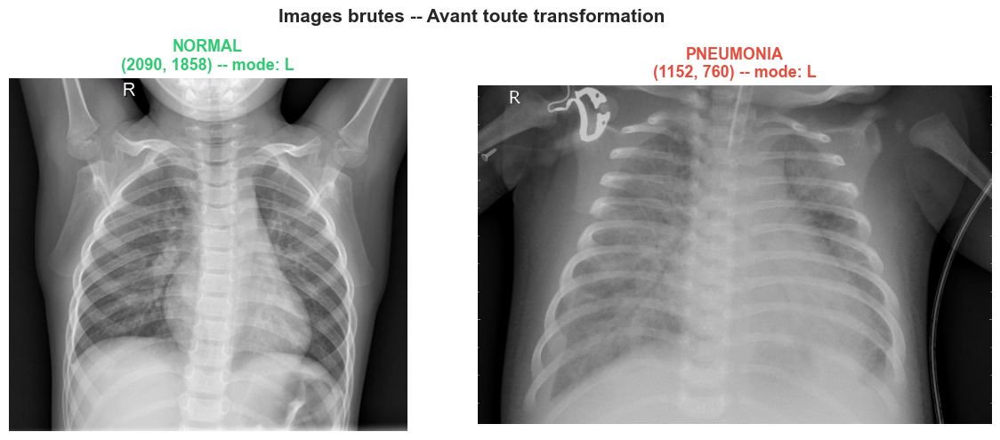

In [7]:
# ============================================================
# CHARGER UNE IMAGE D'EXEMPLE PAR CLASSE
# ============================================================
normal_dir = os.path.join(TRAIN_DIR, 'NORMAL')
pneumo_dir = os.path.join(TRAIN_DIR, 'PNEUMONIA')

# list_image_files exclut automatiquement .DS_Store et tout fichier non-image
normal_files = list_image_files(normal_dir)
pneumo_files = list_image_files(pneumo_dir)

print(f"Fichiers NORMAL   : {len(normal_files)} images (premier : {normal_files[0]})")
print(f"Fichiers PNEUMONIA: {len(pneumo_files)} images (premier : {pneumo_files[0]})")

img_normal_raw = Image.open(os.path.join(normal_dir, normal_files[0]))
img_pneumo_raw = Image.open(os.path.join(pneumo_dir, pneumo_files[0]))

fig, axes = plt.subplots(1, 2, figsize=(12, 5))
axes[0].imshow(img_normal_raw, cmap='gray')
axes[0].set_title(f'NORMAL\n{img_normal_raw.size} -- mode: {img_normal_raw.mode}',
                  fontweight='bold', color='#2ecc71', fontsize=13)
axes[0].axis('off')

axes[1].imshow(img_pneumo_raw, cmap='gray')
axes[1].set_title(f'PNEUMONIA\n{img_pneumo_raw.size} -- mode: {img_pneumo_raw.mode}',
                  fontweight='bold', color='#e74c3c', fontsize=13)
axes[1].axis('off')

plt.suptitle('Images brutes -- Avant toute transformation', fontsize=15, fontweight='bold')
plt.tight_layout()
plt.show()



## B.3 — Etape 1 : Conversion en Niveaux de Gris (Grayscale)

### Pourquoi ?

Les radiographies sont des images **intrinsequement monochromes**. La couleur n'apporte rien.

### Impact technique

| Aspect | RGB (3 canaux) | Grayscale (1 canal) |
|--------|----------------|---------------------|
| **Shape** | (H, W, 3) | (H, W, 1) |
| **Memoire** | 3x plus lourd | 3x plus leger |
| **Info utile** | Les 3 canaux sont quasi-identiques | Aucune perte |

### Formule

$$Gray = 0.299 \times R + 0.587 \times G + 0.114 \times B$$

### Quand l'utiliser ?

- **Oui** : radiographies, IRM, scanners
- **Non** : si la couleur est importante (dermatologie, detection de fruits)


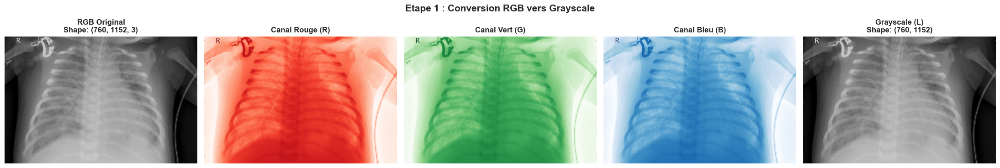

Les 3 canaux RGB sont quasi-identiques -> la conversion en gris ne perd rien
   RGB shape  : (760, 1152, 3) -> 2,626,560 valeurs
   Gray shape : (760, 1152) -> 875,520 valeurs
   Reduction  : x3 en memoire


In [8]:
# ============================================================
# ETAPE 1 : CONVERSION EN NIVEAUX DE GRIS
# ============================================================
img_example = img_pneumo_raw.copy()

img_rgb = img_example.convert('RGB')
img_gray = img_example.convert('L')

img_rgb_array = np.array(img_rgb)
img_gray_array = np.array(img_gray)

fig, axes = plt.subplots(1, 5, figsize=(22, 4))

axes[0].imshow(img_rgb_array)
axes[0].set_title(f'RGB Original\nShape: {img_rgb_array.shape}', fontweight='bold')
axes[0].axis('off')

for i, (name, cmap) in enumerate([('Rouge (R)', 'Reds'), ('Vert (G)', 'Greens'), ('Bleu (B)', 'Blues')]):
    axes[i+1].imshow(img_rgb_array[:,:,i], cmap=cmap)
    axes[i+1].set_title(f'Canal {name}', fontweight='bold')
    axes[i+1].axis('off')

axes[4].imshow(img_gray_array, cmap='gray')
axes[4].set_title(f'Grayscale (L)\nShape: {img_gray_array.shape}', fontweight='bold')
axes[4].axis('off')

plt.suptitle('Etape 1 : Conversion RGB vers Grayscale', fontsize=15, fontweight='bold')
plt.tight_layout()
plt.show()

print(f"Les 3 canaux RGB sont quasi-identiques -> la conversion en gris ne perd rien")
print(f"   RGB shape  : {img_rgb_array.shape} -> {img_rgb_array.shape[0]*img_rgb_array.shape[1]*3:,} valeurs")
print(f"   Gray shape : {img_gray_array.shape} -> {img_gray_array.shape[0]*img_gray_array.shape[1]:,} valeurs")
print(f"   Reduction  : x3 en memoire")



## B.4 — Etape 2 : Redimensionnement (Resize)

### Pourquoi ?

Un modele attend des **entrees de taille fixe**.

### Methodes d'interpolation

| Methode | Qualite | Usage |
|---------|---------|-------|
| **NEAREST** | Basse | Masques de segmentation |
| **BILINEAR** | Moyenne | Bon compromis par defaut |
| **BICUBIC** | Haute | Meilleure qualite |
| **LANCZOS** | Tres haute | Meilleure pour reduction |

### Quelle taille ?

| Taille | Usage |
|--------|-------|
| **128x128** | ML classique |
| **224x224** | Standard pre-entraine (MobileNet, ResNet) |
| **299x299** | InceptionV3, Xception |


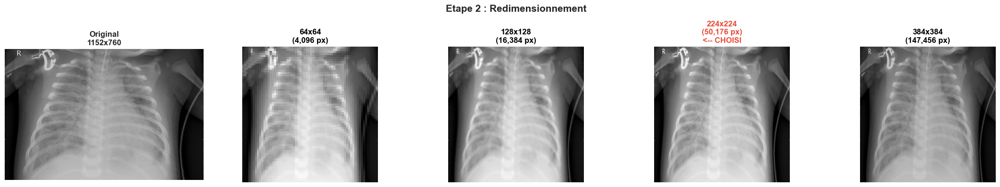

In [9]:
# ============================================================
# ETAPE 2 : REDIMENSIONNEMENT
# ============================================================
img_gray = img_pneumo_raw.convert('L')
original_size = img_gray.size

sizes = [64, 128, 224, 384]
fig, axes = plt.subplots(1, len(sizes) + 1, figsize=(22, 4))

axes[0].imshow(img_gray, cmap='gray')
axes[0].set_title(f'Original\n{original_size[0]}x{original_size[1]}', fontweight='bold')
axes[0].axis('off')

for i, size in enumerate(sizes):
    resized = img_gray.resize((size, size), Image.LANCZOS)
    title = f'{size}x{size}\n({size*size:,} px)'
    if size == 224:
        title += '\n<-- CHOISI'
    axes[i+1].imshow(resized, cmap='gray')
    axes[i+1].set_title(title, fontweight='bold',
                        color='#e74c3c' if size == 224 else 'black')
    axes[i+1].axis('off')

plt.suptitle('Etape 2 : Redimensionnement', fontsize=15, fontweight='bold')
plt.tight_layout()
plt.show()


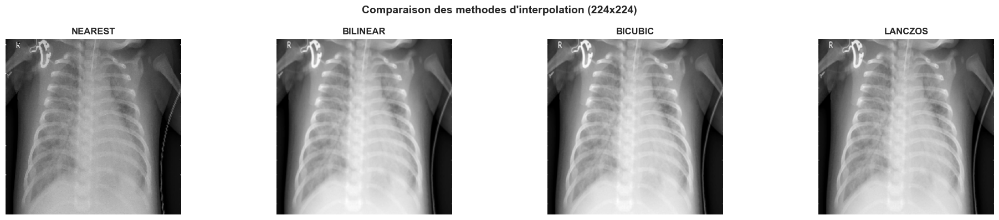

In [10]:
# ============================================================
# COMPARAISON DES METHODES D'INTERPOLATION
# ============================================================
methods = {
    'NEAREST': Image.NEAREST, 'BILINEAR': Image.BILINEAR,
    'BICUBIC': Image.BICUBIC, 'LANCZOS': Image.LANCZOS
}

fig, axes = plt.subplots(1, 4, figsize=(20, 4))
for ax, (name, method) in zip(axes, methods.items()):
    resized = img_gray.resize((224, 224), method)
    ax.imshow(resized, cmap='gray')
    ax.set_title(name, fontweight='bold', fontsize=12)
    ax.axis('off')

plt.suptitle('Comparaison des methodes d\'interpolation (224x224)', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()



## B.5 — Etape 3 : Normalisation des Pixels

### Les 3 strategies

| Methode | Formule | Resultat | Usage |
|---------|---------|----------|-------|
| **Min-Max [0, 1]** | `pixel / 255.0` | 0 a 1 | CNN custom |
| **Centrage [-1, 1]** | `(pixel / 127.5) - 1` | -1 a 1 | MobileNet |
| **Standardisation** | `(pixel - mean) / std` | mu=0, sigma=1 | ImageNet |

### Pourquoi ca aide ?

1. **Convergence plus rapide** : gradients mieux proportionnes
2. **Stabilite numerique** : evite les overflow/underflow
3. **Egalite des features** : tous les pixels a la meme echelle


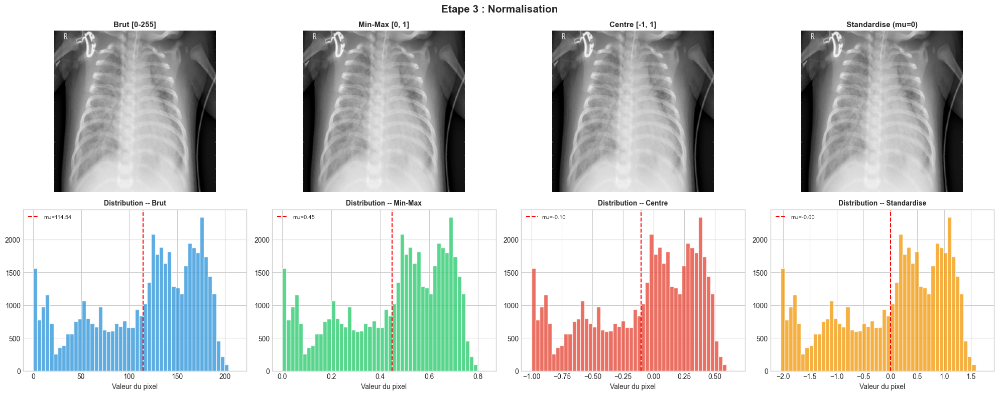

-> On utilisera rescale=1./255 (Min-Max) pour nos CNN custom
-> Pour MobileNetV2, le preprocessing integre (Centre [-1, 1])


In [11]:
# ============================================================
# ETAPE 3 : NORMALISATION
# ============================================================
img_gray_224 = img_gray.resize((224, 224), Image.LANCZOS)
pixels_raw = np.array(img_gray_224).astype(np.float32)

pixels_minmax   = pixels_raw / 255.0
pixels_centered = (pixels_raw / 127.5) - 1.0
pixels_standard = (pixels_raw - pixels_raw.mean()) / pixels_raw.std()

fig, axes = plt.subplots(2, 4, figsize=(20, 8))

for i, (title, data) in enumerate([
    ('Brut [0-255]', pixels_raw), ('Min-Max [0, 1]', pixels_minmax),
    ('Centre [-1, 1]', pixels_centered), ('Standardise (mu=0)', pixels_standard),
]):
    axes[0, i].imshow(data, cmap='gray')
    axes[0, i].set_title(title, fontweight='bold', fontsize=11)
    axes[0, i].axis('off')

colors = ['#3498db', '#2ecc71', '#e74c3c', '#f39c12']
for i, (title, data, color) in enumerate(zip(
    ['Brut', 'Min-Max', 'Centre', 'Standardise'],
    [pixels_raw.flatten(), pixels_minmax.flatten(), pixels_centered.flatten(), pixels_standard.flatten()],
    colors
)):
    axes[1, i].hist(data, bins=50, color=color, edgecolor='white', alpha=0.8)
    axes[1, i].set_title(f'Distribution -- {title}', fontsize=10, fontweight='bold')
    axes[1, i].set_xlabel('Valeur du pixel')
    axes[1, i].axvline(data.mean(), color='red', linestyle='--', linewidth=1.5, label=f'mu={data.mean():.2f}')
    axes[1, i].legend(fontsize=8)

plt.suptitle('Etape 3 : Normalisation', fontsize=15, fontweight='bold')
plt.tight_layout()
plt.show()

print(f"-> On utilisera rescale=1./255 (Min-Max) pour nos CNN custom")
print(f"-> Pour MobileNetV2, le preprocessing integre (Centre [-1, 1])")



## B.6 — Etape 4 : Egalisation d'Histogramme

### Deux methodes

| Methode | Description | Avantage |
|---------|-------------|----------|
| **Histogram Equalization (HE)** | Redistribution globale | Simple |
| **CLAHE** | Egalisation par zones locales | Meilleur rendu, moins de bruit |


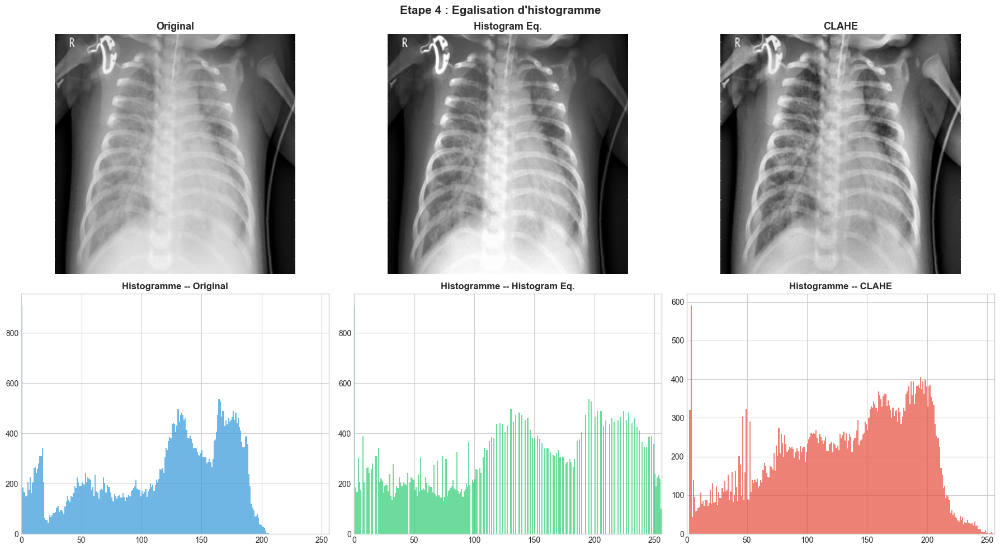

CLAHE donne un meilleur resultat : contraste ameliore sans sur-amplifier le bruit


In [12]:
# ============================================================
# ETAPE 4 : EGALISATION D'HISTOGRAMME
# ============================================================
img_gray_np = np.array(img_gray.resize((224, 224), Image.LANCZOS))

img_he = cv2.equalizeHist(img_gray_np)
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
img_clahe = clahe.apply(img_gray_np)

fig, axes = plt.subplots(2, 3, figsize=(18, 10))

for i, (title, img) in enumerate([('Original', img_gray_np), ('Histogram Eq.', img_he), ('CLAHE', img_clahe)]):
    axes[0, i].imshow(img, cmap='gray')
    axes[0, i].set_title(title, fontweight='bold', fontsize=13)
    axes[0, i].axis('off')

for i, (title, img, color) in enumerate(zip(
    ['Original', 'Histogram Eq.', 'CLAHE'],
    [img_gray_np, img_he, img_clahe], ['#3498db', '#2ecc71', '#e74c3c']
)):
    axes[1, i].hist(img.flatten(), bins=256, range=(0, 256), color=color, alpha=0.7, edgecolor='none')
    axes[1, i].set_title(f'Histogramme -- {title}', fontweight='bold')
    axes[1, i].set_xlim([0, 256])

plt.suptitle('Etape 4 : Egalisation d\'histogramme', fontsize=15, fontweight='bold')
plt.tight_layout()
plt.show()

print("CLAHE donne un meilleur resultat : contraste ameliore sans sur-amplifier le bruit")




## B.7 — Etape 5 : Filtrage et Debruitage

| Filtre | Effet | Usage |
|--------|-------|-------|
| **Flou Gaussien** | Lissage doux | Bruit leger |
| **Filtre Median** | Mediane des voisins | Bruit sel et poivre |
| **Filtre Bilateral** | Lisse en preservant les contours | Meilleur compromis |
| **Canny** | Detection de contours | Analyse morphologique |


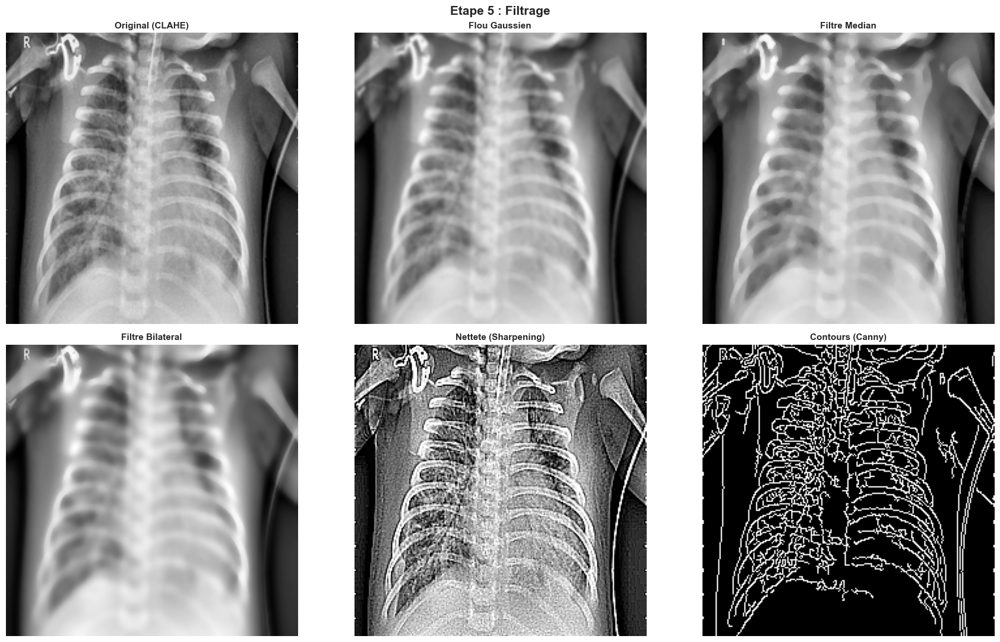

Pour notre projet : pas de filtrage supplementaire.
   -> Les CNN apprennent eux-memes des filtres


In [13]:
# ============================================================
# ETAPE 5 : FILTRAGE
# ============================================================
img_src = img_clahe.copy()

img_gaussian  = cv2.GaussianBlur(img_src, (5, 5), 0)
img_median    = cv2.medianBlur(img_src, 5)
img_bilateral = cv2.bilateralFilter(img_src, 9, 75, 75)
img_canny     = cv2.Canny(img_src, 50, 150)
kernel_sharp  = np.array([[-1,-1,-1], [-1,9,-1], [-1,-1,-1]])
img_sharp     = cv2.filter2D(img_src, -1, kernel_sharp)

fig, axes = plt.subplots(2, 3, figsize=(18, 11))
for ax, (title, img) in zip(axes.flatten(), [
    ('Original (CLAHE)', img_src), ('Flou Gaussien', img_gaussian),
    ('Filtre Median', img_median), ('Filtre Bilateral', img_bilateral),
    ('Nettete (Sharpening)', img_sharp), ('Contours (Canny)', img_canny),
]):
    ax.imshow(img, cmap='gray')
    ax.set_title(title, fontweight='bold', fontsize=11)
    ax.axis('off')

plt.suptitle('Etape 5 : Filtrage', fontsize=15, fontweight='bold')
plt.tight_layout()
plt.show()

print("Pour notre projet : pas de filtrage supplementaire.")
print("   -> Les CNN apprennent eux-memes des filtres")


---

## B.8 — Etape 6 : Data Augmentation

### Justification medicale de chaque transformation

| Transformation | Justification | Parametre |
|----------------|--------------|-----------|
| **Rotation** | Patient legerement tourne | +/-15 deg. |
| **Translation** | Cadrage variable | +/-10% |
| **Zoom** | Distance patient-appareil variable | +/-10% |
| **Flip horizontal** | Anatomie quasi-symetrique | Oui |
| **Flip vertical** | NON — une radio n'est jamais a l'envers | Non |
| **Cisaillement** | Deformations de perspective | +/-10% |
| **Luminosite** | Reglages d'exposition differents | +/-20% |

**Regle d'or** : augmentation uniquement sur le train, jamais sur val/test.


1. ROTATION (+/-15 deg.)


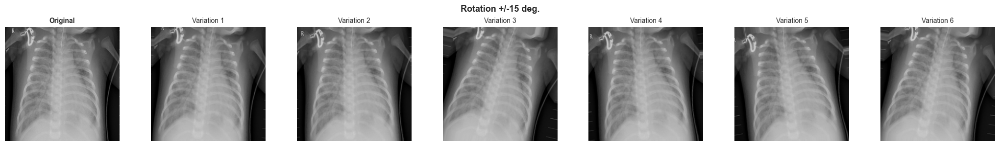


2. TRANSLATION (+/-10%)


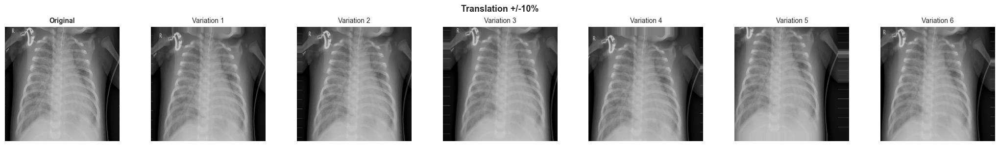


3. ZOOM (+/-10%)


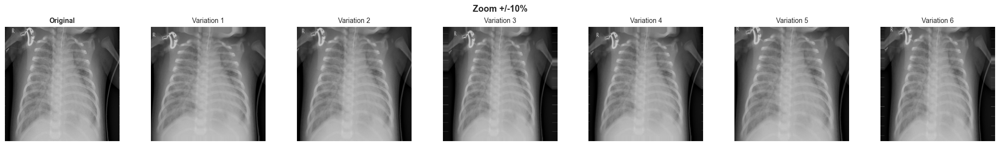


4. FLIP HORIZONTAL


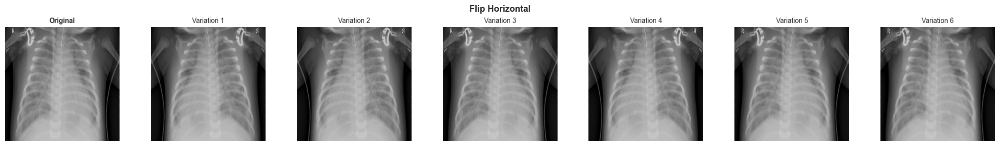


5. CISAILLEMENT (+/-10%)


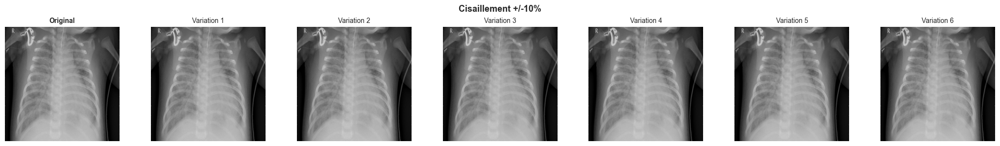


6. LUMINOSITE (+/-20%)


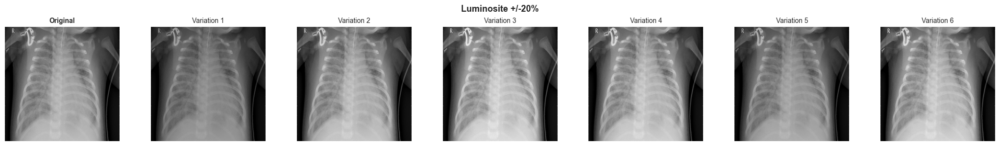

In [14]:
# ============================================================
# ETAPE 6 : DATA AUGMENTATION — Chaque transformation isolee
# ============================================================
img_ref = img_gray.resize((224, 224), Image.LANCZOS)
img_ref_array = np.array(img_ref).astype(np.float32) / 255.0

# ImageDataGenerator attend des pixels en [0, 255] pour brightness_range
img_ref_uint8 = np.array(img_ref).astype(np.float32)
img_ref_3ch = np.stack([img_ref_uint8]*3, axis=-1)
img_ref_batch = np.expand_dims(img_ref_3ch, 0)

def show_augmentation(datagen, title, n=6):
    gen = datagen.flow(img_ref_batch, batch_size=1)
    fig, axes = plt.subplots(1, n+1, figsize=(3*(n+1), 3))
    axes[0].imshow(img_ref_array, cmap='gray', vmin=0, vmax=1)
    axes[0].set_title('Original', fontweight='bold', fontsize=10)
    axes[0].axis('off')
    for i in range(n):
        aug_img = next(gen)[0]
        # Renormaliser en [0, 1] pour l'affichage
        display_img = np.clip(aug_img[:,:,0] / 255.0, 0, 1)
        axes[i+1].imshow(display_img, cmap='gray', vmin=0, vmax=1)
        axes[i+1].set_title(f'Variation {i+1}', fontsize=10)
        axes[i+1].axis('off')
    plt.suptitle(title, fontsize=13, fontweight='bold')
    plt.tight_layout()
    plt.show()

print("1. ROTATION (+/-15 deg.)")
show_augmentation(ImageDataGenerator(rotation_range=15), 'Rotation +/-15 deg.')

print("\n2. TRANSLATION (+/-10%)")
show_augmentation(ImageDataGenerator(width_shift_range=0.1, height_shift_range=0.1), 'Translation +/-10%')

print("\n3. ZOOM (+/-10%)")
show_augmentation(ImageDataGenerator(zoom_range=0.1), 'Zoom +/-10%')

print("\n4. FLIP HORIZONTAL")
show_augmentation(ImageDataGenerator(horizontal_flip=True), 'Flip Horizontal')

print("\n5. CISAILLEMENT (+/-10%)")
show_augmentation(ImageDataGenerator(shear_range=0.1), 'Cisaillement +/-10%')

print("\n6. LUMINOSITE (+/-20%)")
show_augmentation(ImageDataGenerator(brightness_range=[0.8, 1.2]), 'Luminosite +/-20%')


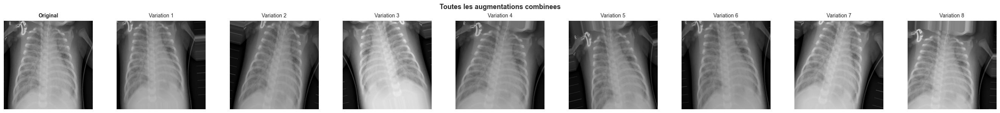

A chaque epoque, le modele voit des versions DIFFERENTES de chaque image
-> Cela force le modele a apprendre des features ROBUSTES


In [15]:
# ============================================================
# COMBINAISON DE TOUTES LES AUGMENTATIONS
# ============================================================
full_datagen = ImageDataGenerator(
    rotation_range=15, width_shift_range=0.1, height_shift_range=0.1,
    shear_range=0.1, zoom_range=0.1, horizontal_flip=True,
    brightness_range=[0.8, 1.2], fill_mode='nearest'
)

show_augmentation(full_datagen, 'Toutes les augmentations combinees', n=8)

print("A chaque epoque, le modele voit des versions DIFFERENTES de chaque image")
print("-> Cela force le modele a apprendre des features ROBUSTES")




## B.9 — Pipeline complet

| # | Etape | Methode | Pourquoi |
|---|-------|---------|----------|
| 1 | Couleur | RGB (3 canaux) | MobileNetV2 attend du RGB |
| 2 | Resize | 224x224 | Taille standard |
| 3 | Normalisation | /255.0 | Convergence rapide |
| 4 | Augmentation (train) | Rotation, shift, zoom, flip | Anti-overfitting |




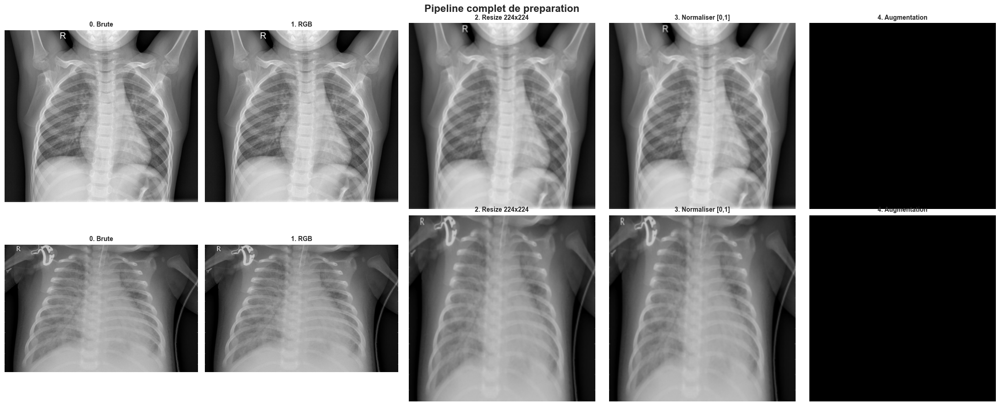

In [16]:
# ============================================================
# PIPELINE COMPLET — Avant / Apres
# ============================================================
fig, axes = plt.subplots(2, 5, figsize=(22, 9))

for row, (cls, img_raw) in enumerate(zip(CLASSES, [img_normal_raw, img_pneumo_raw])):
    color = '#2ecc71' if cls == 'NORMAL' else '#e74c3c'
    
    axes[row, 0].imshow(img_raw, cmap='gray')
    axes[row, 0].set_title('0. Brute', fontweight='bold', fontsize=10)
    
    img_rgb = img_raw.convert('RGB')
    axes[row, 1].imshow(img_rgb)
    axes[row, 1].set_title('1. RGB', fontweight='bold', fontsize=10)
    
    img_resized = img_rgb.resize((224, 224), Image.BILINEAR)
    axes[row, 2].imshow(img_resized)
    axes[row, 2].set_title('2. Resize 224x224', fontweight='bold', fontsize=10)
    
    img_norm = np.array(img_resized).astype(np.float32) / 255.0
    axes[row, 3].imshow(img_norm)
    axes[row, 3].set_title('3. Normaliser [0,1]', fontweight='bold', fontsize=10)
    
    img_batch = np.expand_dims(img_norm, 0)
    img_aug = next(full_datagen.flow(img_batch, batch_size=1))[0]
    axes[row, 4].imshow(img_aug)
    axes[row, 4].set_title('4. Augmentation', fontweight='bold', fontsize=10)
    
    for ax in axes[row]:
        ax.axis('off')
    axes[row, 0].set_ylabel(cls, fontsize=14, fontweight='bold', color=color, rotation=0, labelpad=80)

plt.suptitle('Pipeline complet de preparation', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()



# Partie C — Regression Logistique (ML Classique)




Avant le Deep Learning, on commence par un modele simple pour obtenir une **baseline**.

$$P(\text{Pneumonia}) = \sigma(\mathbf{w}^T \mathbf{x} + b) = \frac{1}{1 + e^{-(\mathbf{w}^T \mathbf{x} + b)}}$$


In [17]:
# ============================================================
# CHARGEMENT DES IMAGES EN VECTEURS
# ============================================================
ML_IMG_SIZE = 128

def load_images_as_vectors(directory, img_size=ML_IMG_SIZE, max_per_class=None):
    X, y = [], []
    for label, cls in enumerate(CLASSES):
        cls_dir = os.path.join(directory, cls)
        files = list_image_files(cls_dir)
        if max_per_class:
            files = files[:max_per_class]
        for fname in files:
            try:
                img = Image.open(os.path.join(cls_dir, fname))
                img = img.convert('L').resize((img_size, img_size))
                arr = np.array(img).flatten() / 255.0
                X.append(arr)
                y.append(label)
            except:
                pass
    return np.array(X), np.array(y)

print("Chargement des images en vecteurs (1-2 min)...\n")
X_train_ml, y_train_ml = load_images_as_vectors(TRAIN_DIR)
X_val_ml, y_val_ml     = load_images_as_vectors(VAL_DIR)
X_test_ml, y_test_ml   = load_images_as_vectors(TEST_DIR)

print(f"Train : {X_train_ml.shape}  |  Val : {X_val_ml.shape}  |  Test : {X_test_ml.shape}")


Chargement des images en vecteurs (1-2 min)...

Train : (5216, 16384)  |  Val : (16, 16384)  |  Test : (624, 16384)


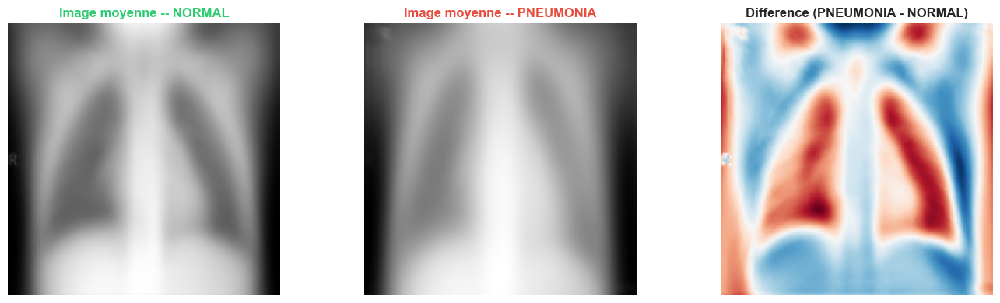

Rouge = plus intense en PNEUMONIA | Bleu = plus intense en NORMAL


In [18]:
# ============================================================
# IMAGE MOYENNE PAR CLASSE + DIFFERENCE
# ============================================================
fig, axes = plt.subplots(1, 3, figsize=(14, 4))

for label, cls in enumerate(CLASSES):
    mask = y_train_ml == label
    mean_img = X_train_ml[mask].mean(axis=0).reshape(ML_IMG_SIZE, ML_IMG_SIZE)
    color = '#2ecc71' if cls == 'NORMAL' else '#e74c3c'
    axes[label].imshow(mean_img, cmap='gray')
    axes[label].set_title(f'Image moyenne -- {cls}', fontweight='bold', color=color)
    axes[label].axis('off')

diff = X_train_ml[y_train_ml==1].mean(0) - X_train_ml[y_train_ml==0].mean(0)
axes[2].imshow(diff.reshape(ML_IMG_SIZE, ML_IMG_SIZE), cmap='RdBu_r')
axes[2].set_title('Difference (PNEUMONIA - NORMAL)', fontweight='bold')
axes[2].axis('off')

plt.tight_layout()
plt.show()

print("Rouge = plus intense en PNEUMONIA | Bleu = plus intense en NORMAL")


PCA : 16384 features -> 150 composantes...
Variance expliquee cumulee : 90.7%


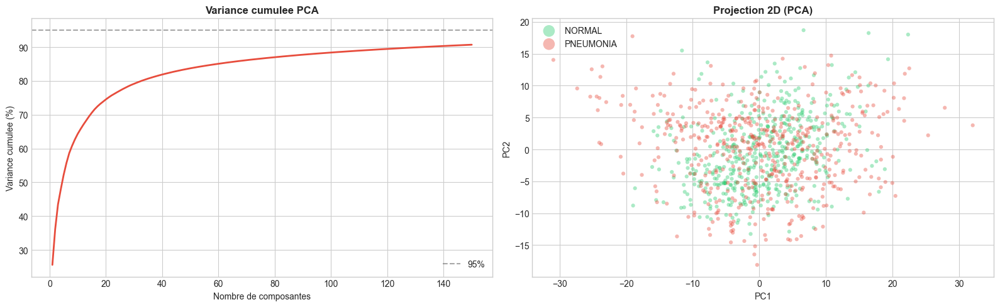

In [19]:
# ============================================================
# PCA + PROJECTION 2D
# ============================================================
N_COMPONENTS = 150
print(f"PCA : {X_train_ml.shape[1]} features -> {N_COMPONENTS} composantes...")
pca = PCA(n_components=N_COMPONENTS, random_state=SEED)
X_train_pca = pca.fit_transform(X_train_ml)
X_val_pca   = pca.transform(X_val_ml)
X_test_pca  = pca.transform(X_test_ml)
print(f"Variance expliquee cumulee : {pca.explained_variance_ratio_.sum():.1%}")

fig, axes = plt.subplots(1, 2, figsize=(16, 5))

cumvar = np.cumsum(pca.explained_variance_ratio_) * 100
axes[0].plot(range(1, N_COMPONENTS+1), cumvar, color='#e74c3c', linewidth=2)
axes[0].axhline(y=95, color='gray', linestyle='--', alpha=0.7, label='95%')
axes[0].set_xlabel('Nombre de composantes')
axes[0].set_ylabel('Variance cumulee (%)')
axes[0].set_title('Variance cumulee PCA', fontweight='bold')
axes[0].legend()

for label, cls in enumerate(CLASSES):
    mask = y_train_ml == label
    idx = np.where(mask)[0]
    si = np.random.choice(idx, size=min(500, len(idx)), replace=False)
    color = '#2ecc71' if cls == 'NORMAL' else '#e74c3c'
    axes[1].scatter(X_train_pca[si, 0], X_train_pca[si, 1], c=color, label=cls, alpha=0.4, s=20, edgecolors='none')
axes[1].set_xlabel('PC1')
axes[1].set_ylabel('PC2')
axes[1].set_title('Projection 2D (PCA)', fontweight='bold')
axes[1].legend(markerscale=3)

plt.tight_layout()
plt.show()


In [20]:
# ============================================================
# ENTRAINEMENT REGRESSION LOGISTIQUE
# ============================================================
print("Entrainement de la Regression Logistique...\n")
logreg = LogisticRegression(max_iter=1000, C=1.0, class_weight='balanced', solver='lbfgs', random_state=SEED)
logreg.fit(X_train_pca, y_train_ml)

y_pred_test = logreg.predict(X_test_pca)
y_proba_test = logreg.predict_proba(X_test_pca)[:, 1]

print(f"Train Accuracy : {logreg.score(X_train_pca, y_train_ml):.4f}")
print(f"Test Accuracy  : {accuracy_score(y_test_ml, y_pred_test):.4f}")
print(f"AUC            : {roc_auc_score(y_test_ml, y_proba_test):.4f}")


Entrainement de la Regression Logistique...

Train Accuracy : 0.9641
Test Accuracy  : 0.7644
AUC            : 0.8942


RAPPORT -- Regression Logistique (Test)
              precision    recall  f1-score   support

      NORMAL       0.91      0.41      0.57       234
   PNEUMONIA       0.73      0.98      0.84       390

    accuracy                           0.76       624
   macro avg       0.82      0.69      0.70       624
weighted avg       0.80      0.76      0.74       624



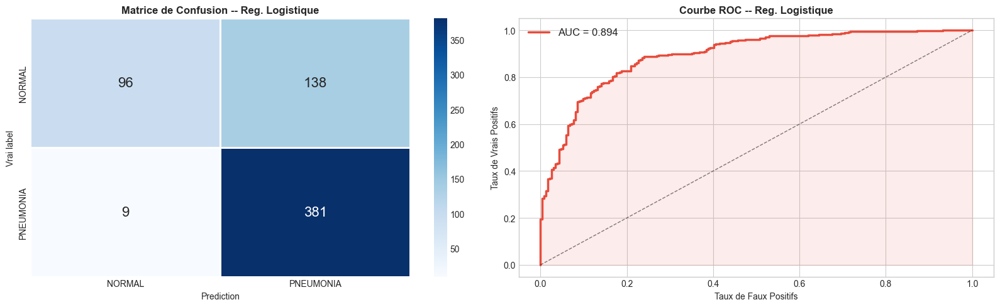

In [21]:
# ============================================================
# EVALUATION REGRESSION LOGISTIQUE
# ============================================================
def plot_confusion_matrix(y_true, y_pred, title="Matrice de Confusion", ax=None):
    cm = confusion_matrix(y_true, y_pred)
    if ax is None:
        fig, ax = plt.subplots(figsize=(7, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=CLASSES, yticklabels=CLASSES,
                ax=ax, annot_kws={"size": 16}, linewidths=2, linecolor='white')
    ax.set_ylabel('Vrai label')
    ax.set_xlabel('Prediction')
    ax.set_title(title, fontweight='bold')
    return cm

print("=" * 60)
print("RAPPORT -- Regression Logistique (Test)")
print("=" * 60)
print(classification_report(y_test_ml, y_pred_test, target_names=CLASSES))

fig, axes = plt.subplots(1, 2, figsize=(16, 5))

plot_confusion_matrix(y_test_ml, y_pred_test, 'Matrice de Confusion -- Reg. Logistique', ax=axes[0])

fpr_lr, tpr_lr, _ = roc_curve(y_test_ml, y_proba_test)
auc_lr = roc_auc_score(y_test_ml, y_proba_test)
axes[1].plot(fpr_lr, tpr_lr, color='#e74c3c', linewidth=2.5, label=f'AUC = {auc_lr:.3f}')
axes[1].plot([0, 1], [0, 1], 'k--', linewidth=1, alpha=0.5)
axes[1].fill_between(fpr_lr, tpr_lr, alpha=0.1, color='#e74c3c')
axes[1].set_xlabel('Taux de Faux Positifs')
axes[1].set_ylabel('Taux de Vrais Positifs')
axes[1].set_title('Courbe ROC -- Reg. Logistique', fontweight='bold')
axes[1].legend(fontsize=12)

plt.tight_layout()
plt.show()




# Partie D — CNN from Scratch


```
Image (224x224x3)
  -> Conv2D(32) + BN + ReLU + MaxPool
  -> Conv2D(64) + BN + ReLU + MaxPool
  -> Conv2D(128) + BN + ReLU + MaxPool
  -> Conv2D(256) + BN + ReLU + MaxPool
  -> GlobalAveragePooling2D
  -> Dense(128) + Dropout(0.5)
  -> Dense(1, sigmoid)
```


In [22]:
# ============================================================
# DATA GENERATORS
# ============================================================
train_datagen = ImageDataGenerator(
    rescale=1./255, rotation_range=15, width_shift_range=0.1, height_shift_range=0.1,
    shear_range=0.1, zoom_range=0.1, horizontal_flip=True, brightness_range=[0.8, 1.2],
    fill_mode='nearest'
)
val_test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    TRAIN_DIR, target_size=(IMG_SIZE, IMG_SIZE), batch_size=BATCH_SIZE, class_mode='binary', shuffle=True, seed=SEED
)
val_generator = val_test_datagen.flow_from_directory(
    VAL_DIR, target_size=(IMG_SIZE, IMG_SIZE), batch_size=BATCH_SIZE, class_mode='binary', shuffle=False
)
test_generator = val_test_datagen.flow_from_directory(
    TEST_DIR, target_size=(IMG_SIZE, IMG_SIZE), batch_size=BATCH_SIZE, class_mode='binary', shuffle=False
)

print(f"\nClasses : {train_generator.class_indices}")


Found 5219 images belonging to 2 classes.
Found 16 images belonging to 2 classes.
Found 624 images belonging to 2 classes.

Classes : {'NORMAL': 0, 'PNEUMONIA': 1}


In [23]:
# ============================================================
# CONSTRUCTION + COMPILATION CNN
# ============================================================
def build_cnn(input_shape=(IMG_SIZE, IMG_SIZE, 3)):
    model = models.Sequential(name="CNN_Pneumonia")
    for filters in [32, 64, 128, 256]:
        model.add(layers.Conv2D(filters, (3,3), activation='relu', padding='same',
                               input_shape=input_shape if filters == 32 else None))
        model.add(layers.BatchNormalization())
        model.add(layers.MaxPooling2D((2,2)))
    model.add(layers.GlobalAveragePooling2D())
    model.add(layers.Dense(128, activation='relu'))
    model.add(layers.Dropout(0.5))
    model.add(layers.Dense(1, activation='sigmoid'))
    return model

n_normal = train_counts.get('NORMAL', 1)
n_pneumonia = train_counts.get('PNEUMONIA', 1)
total = n_normal + n_pneumonia
class_weight = {0: total / (2*n_normal), 1: total / (2*n_pneumonia)}
print(f"Class weights : {class_weight}")

# Chemins de sauvegarde
CNN_PATH = "models/cnn_scratch.keras"
TL_PATH  = "models/transfer_learning.keras"
FT_PATH  = "models/fine_tuning.keras"
os.makedirs("models", exist_ok=True)

cnn_model = build_cnn()
cnn_model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001),
                  loss='binary_crossentropy', metrics=['accuracy'])
cnn_model.summary()


Class weights : {0: 1.9448173005219984, 1: 0.6730322580645162}


2026-02-27 21:26:47.849741: I metal_plugin/src/device/metal_device.cc:1154] Metal device set to: Apple M3 Pro
2026-02-27 21:26:47.851664: I metal_plugin/src/device/metal_device.cc:296] systemMemory: 18.00 GB
2026-02-27 21:26:47.851682: I metal_plugin/src/device/metal_device.cc:313] maxCacheSize: 6.00 GB
2026-02-27 21:26:47.852041: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2026-02-27 21:26:47.852624: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


Model: "CNN_Pneumonia"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 224, 224, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 224, 224, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 112, 112, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 112, 112, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 56, 56, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 56, 56, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 28, 28, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 28, 28, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 14, 14, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 256)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 423,361 (1.61 MB)

 Trainable params: 422,401 (1.61 MB)

 Non-trainable params: 960 (3.75 KB)

In [24]:
# ============================================================
# ENTRAINEMENT CNN (ou chargement si deja entraine)
# ============================================================
if os.path.exists(CNN_PATH):
    print(f"Modele CNN trouve : {CNN_PATH}")
    print("-> Chargement sans reentrainement")
    cnn_model = keras.models.load_model(CNN_PATH)
    history_cnn = None
else:
    print("Pas de modele CNN sauvegarde, entrainement en cours...")
    cnn_callbacks = [
        callbacks.EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True, verbose=1),
        callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-6, verbose=1)
    ]
    history_cnn = cnn_model.fit(
        train_generator, epochs=20, validation_data=val_generator,
        class_weight=class_weight, callbacks=cnn_callbacks, verbose=1
    )
    cnn_model.save(CNN_PATH)
    print(f"Modele sauvegarde : {CNN_PATH}")


Modele CNN trouve : models/cnn_scratch.keras
-> Chargement sans reentrainement


  [Modele charge depuis un fichier, pas de courbes]


2026-02-27 21:27:57.018658: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:117] Plugin optimizer for device_type GPU is enabled.



CNN -- Test Accuracy : 0.9038

RAPPORT -- CNN from Scratch (Test)
              precision    recall  f1-score   support

      NORMAL       0.95      0.78      0.86       234
   PNEUMONIA       0.88      0.98      0.93       390

    accuracy                           0.90       624
   macro avg       0.92      0.88      0.89       624
weighted avg       0.91      0.90      0.90       624



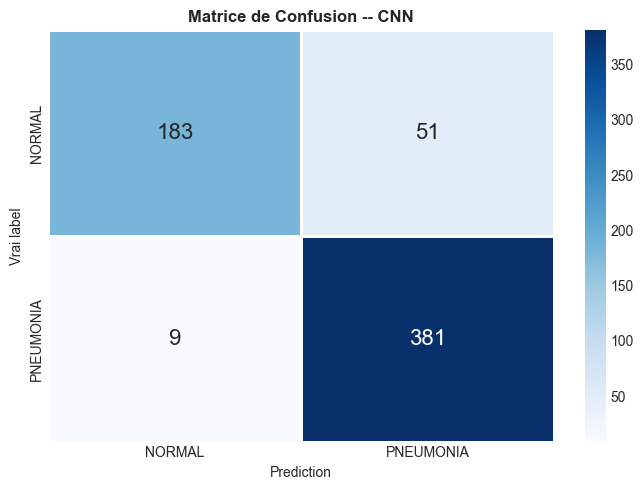

In [25]:
# ============================================================
# COURBES + EVALUATION CNN
# ============================================================
def plot_training_history(history, title=""):
    if history is None:
        print(f"  [Modele charge depuis un fichier, pas de courbes]")
        return
    fig, axes = plt.subplots(1, 2, figsize=(15, 5))
    axes[0].plot(history.history['accuracy'], label='Train', linewidth=2, color='#3498db')
    axes[0].plot(history.history['val_accuracy'], label='Validation', linewidth=2, color='#e74c3c')
    axes[0].set_title('Accuracy', fontweight='bold')
    axes[0].set_xlabel('Epoque')
    axes[0].legend()
    axes[0].grid(True, alpha=0.3)
    axes[1].plot(history.history['loss'], label='Train', linewidth=2, color='#3498db')
    axes[1].plot(history.history['val_loss'], label='Validation', linewidth=2, color='#e74c3c')
    axes[1].set_title('Loss', fontweight='bold')
    axes[1].set_xlabel('Epoque')
    axes[1].legend()
    axes[1].grid(True, alpha=0.3)
    plt.suptitle(f"Courbes d'entrainement -- {title}", fontsize=15, fontweight='bold')
    plt.tight_layout()
    plt.show()
    gap = history.history['accuracy'][-1] - history.history['val_accuracy'][-1]
    print(f"  Train: {history.history['accuracy'][-1]:.4f} | Val: {history.history['val_accuracy'][-1]:.4f} | Gap: {gap:.4f}")

plot_training_history(history_cnn, "CNN from Scratch")

test_generator.reset()
y_pred_cnn_proba = cnn_model.predict(test_generator, verbose=0).flatten()
y_pred_cnn = (y_pred_cnn_proba > 0.5).astype(int)
y_true_cnn = test_generator.classes

print(f"\nCNN -- Test Accuracy : {accuracy_score(y_true_cnn, y_pred_cnn):.4f}")
print(f"\n{'='*60}")
print("RAPPORT -- CNN from Scratch (Test)")
print(f"{'='*60}")
print(classification_report(y_true_cnn, y_pred_cnn, target_names=CLASSES))

fig, ax = plt.subplots(figsize=(7, 5))
plot_confusion_matrix(y_true_cnn, y_pred_cnn, "Matrice de Confusion -- CNN", ax=ax)
plt.tight_layout()
plt.show()




# Partie E — Transfer Learning


On prend **MobileNetV2** pre-entraine sur ImageNet, on **gele** son backbone, et on ajoute notre tete de classification.


In [26]:
# ============================================================
# TRANSFER LEARNING (ou chargement si deja entraine)
# ============================================================
if os.path.exists(TL_PATH):
    print(f"Modele TL trouve : {TL_PATH}")
    print("-> Chargement sans reentrainement")
    tl_model = keras.models.load_model(TL_PATH)
    base_model = tl_model.layers[0]
    history_tl = None
else:
    print("Pas de modele TL sauvegarde, entrainement en cours...")
    base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(IMG_SIZE, IMG_SIZE, 3))
    base_model.trainable = False

    tl_model = models.Sequential(name="TransferLearning_MobileNetV2")
    tl_model.add(base_model)
    tl_model.add(layers.GlobalAveragePooling2D())
    tl_model.add(layers.Dense(128, activation='relu'))
    tl_model.add(layers.Dropout(0.5))
    tl_model.add(layers.Dense(1, activation='sigmoid'))

    tl_model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001),
                     loss='binary_crossentropy', metrics=['accuracy'])

    tl_callbacks = [
        callbacks.EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True, verbose=1),
        callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-6, verbose=1)
    ]
    history_tl = tl_model.fit(
        train_generator, epochs=15, validation_data=val_generator,
        class_weight=class_weight, callbacks=tl_callbacks, verbose=1
    )
    tl_model.save(TL_PATH)
    print(f"Modele sauvegarde : {TL_PATH}")

plot_training_history(history_tl, "Transfer Learning")


Modele TL trouve : models/transfer_learning.keras
-> Chargement sans reentrainement
  [Modele charge depuis un fichier, pas de courbes]


TL -- Test Accuracy : 0.8910

RAPPORT -- Transfer Learning (Test)
              precision    recall  f1-score   support

      NORMAL       0.91      0.79      0.84       234
   PNEUMONIA       0.88      0.95      0.92       390

    accuracy                           0.89       624
   macro avg       0.90      0.87      0.88       624
weighted avg       0.89      0.89      0.89       624



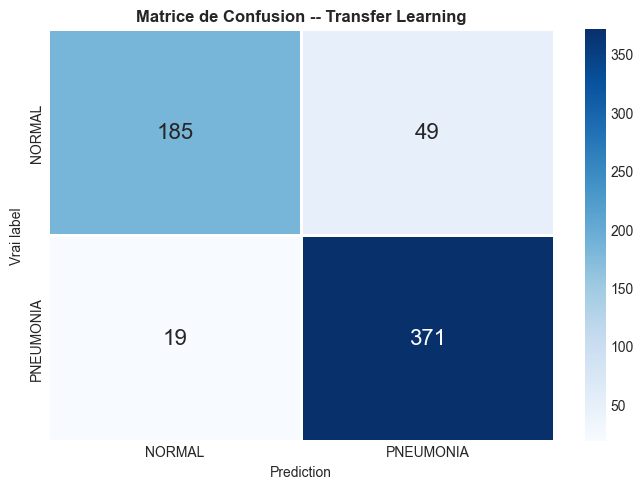

In [27]:
# ============================================================
# EVALUATION TRANSFER LEARNING
# ============================================================
test_generator.reset()
y_pred_tl_proba = tl_model.predict(test_generator, verbose=0).flatten()
y_pred_tl = (y_pred_tl_proba > 0.5).astype(int)
y_true_tl = test_generator.classes

print(f"TL -- Test Accuracy : {accuracy_score(y_true_tl, y_pred_tl):.4f}")
print(f"\n{'='*60}")
print("RAPPORT -- Transfer Learning (Test)")
print(f"{'='*60}")
print(classification_report(y_true_tl, y_pred_tl, target_names=CLASSES))

fig, ax = plt.subplots(figsize=(7, 5))
plot_confusion_matrix(y_true_tl, y_pred_tl, "Matrice de Confusion -- Transfer Learning", ax=ax)
plt.tight_layout()
plt.show()



# Partie F — Fine-Tuning


On **degele les dernieres couches** du backbone avec un **learning rate tres faible** (1e-5).

Regles : (1) Transfer Learning d'abord, (2) lr 100x plus petit, (3) degeler seulement les 30% dernieres couches.


In [28]:
# ============================================================
# FINE-TUNING (ou chargement si deja entraine)
# ============================================================
if os.path.exists(FT_PATH):
    print(f"Modele Fine-Tuning trouve : {FT_PATH}")
    print("-> Chargement sans reentrainement")
    tl_model = keras.models.load_model(FT_PATH)
    history_ft = None
else:
    print("Pas de modele FT sauvegarde, entrainement en cours...")
    base_model.trainable = True
    total_layers = len(base_model.layers)
    fine_tune_at = int(total_layers * 0.7)
    for layer in base_model.layers[:fine_tune_at]:
        layer.trainable = False

    trainable_ft = sum([tf.keras.backend.count_params(w) for w in tl_model.trainable_weights])
    print(f"Couches gelees : {fine_tune_at} / {total_layers}")
    print(f"Params entrainables : {trainable_ft:,}")

    tl_model.compile(optimizer=keras.optimizers.Adam(learning_rate=1e-5),
                     loss='binary_crossentropy', metrics=['accuracy'])

    ft_callbacks = [
        callbacks.EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True, verbose=1),
        callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-7, verbose=1)
    ]
    history_ft = tl_model.fit(
        train_generator, epochs=10, validation_data=val_generator,
        class_weight=class_weight, callbacks=ft_callbacks, verbose=1
    )
    tl_model.save(FT_PATH)
    print(f"Modele sauvegarde : {FT_PATH}")

plot_training_history(history_ft, "Fine-Tuning")


Modele Fine-Tuning trouve : models/fine_tuning.keras
-> Chargement sans reentrainement
  [Modele charge depuis un fichier, pas de courbes]


FT -- Test Accuracy : 0.8798

RAPPORT -- Fine-Tuning (Test)
              precision    recall  f1-score   support

      NORMAL       0.97      0.70      0.81       234
   PNEUMONIA       0.85      0.99      0.91       390

    accuracy                           0.88       624
   macro avg       0.91      0.84      0.86       624
weighted avg       0.89      0.88      0.87       624



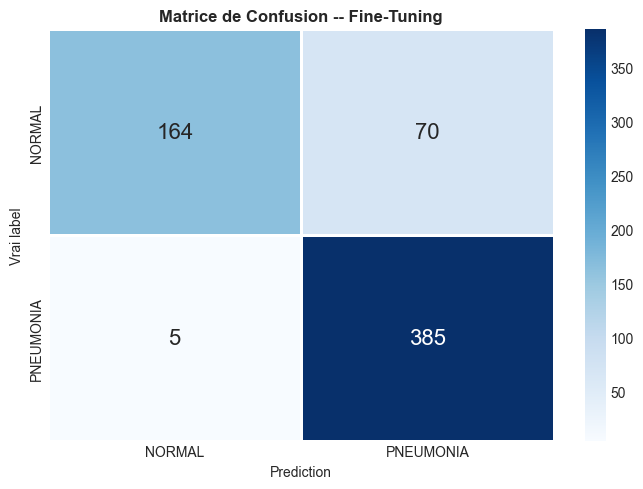

In [29]:
# ============================================================
# EVALUATION FINE-TUNING
# ============================================================
test_generator.reset()
y_pred_ft_proba = tl_model.predict(test_generator, verbose=0).flatten()
y_pred_ft = (y_pred_ft_proba > 0.5).astype(int)
y_true_ft = test_generator.classes

print(f"FT -- Test Accuracy : {accuracy_score(y_true_ft, y_pred_ft):.4f}")
print(f"\n{'='*60}")
print("RAPPORT -- Fine-Tuning (Test)")
print(f"{'='*60}")
print(classification_report(y_true_ft, y_pred_ft, target_names=CLASSES))

fig, ax = plt.subplots(figsize=(7, 5))
plot_confusion_matrix(y_true_ft, y_pred_ft, "Matrice de Confusion -- Fine-Tuning", ax=ax)
plt.tight_layout()
plt.show()


---

# Partie G — Comparaison Finale & Conclusions

---


In [30]:
# ============================================================
# TABLEAU COMPARATIF
# ============================================================
results = {}

cr_lr = classification_report(y_test_ml, y_pred_test, target_names=CLASSES, output_dict=True)
results['Reg. Logistique'] = {
    'Accuracy': accuracy_score(y_test_ml, y_pred_test),
    'Precision': cr_lr['PNEUMONIA']['precision'],
    'Recall': cr_lr['PNEUMONIA']['recall'],
    'F1': cr_lr['PNEUMONIA']['f1-score'],
    'AUC': roc_auc_score(y_test_ml, y_proba_test)
}

for name, yt, yp, ypp in [
    ('CNN Scratch', y_true_cnn, y_pred_cnn, y_pred_cnn_proba),
    ('Transfer Learning', y_true_tl, y_pred_tl, y_pred_tl_proba),
    ('Fine-Tuning', y_true_ft, y_pred_ft, y_pred_ft_proba),
]:
    cr = classification_report(yt, yp, target_names=CLASSES, output_dict=True)
    results[name] = {
        'Accuracy': accuracy_score(yt, yp), 'Precision': cr['PNEUMONIA']['precision'],
        'Recall': cr['PNEUMONIA']['recall'], 'F1': cr['PNEUMONIA']['f1-score'],
        'AUC': roc_auc_score(yt, ypp)
    }

df_results = pd.DataFrame(results).T.round(4)
print("=" * 70)
print("TABLEAU COMPARATIF (classe PNEUMONIA)")
print("=" * 70)
print(df_results.to_string())


TABLEAU COMPARATIF (classe PNEUMONIA)
                   Accuracy  Precision  Recall      F1     AUC
Reg. Logistique      0.7644     0.7341  0.9769  0.8383  0.8942
CNN Scratch          0.9038     0.8819  0.9769  0.9270  0.9617
Transfer Learning    0.8910     0.8833  0.9513  0.9160  0.9683
Fine-Tuning          0.8798     0.8462  0.9872  0.9112  0.9706


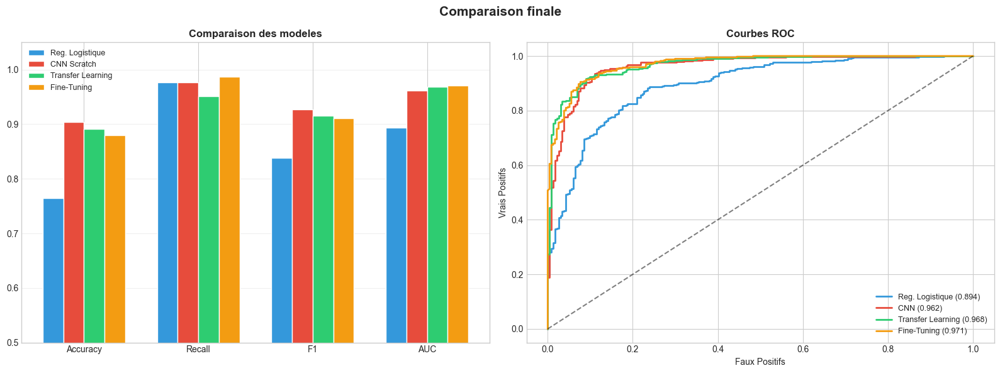

In [31]:
# ============================================================
# GRAPHIQUES COMPARATIFS
# ============================================================
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

metrics_plot = ['Accuracy', 'Recall', 'F1', 'AUC']
x = np.arange(len(metrics_plot))
width = 0.18
bar_colors = ['#3498db', '#e74c3c', '#2ecc71', '#f39c12']

for i, (name, color) in enumerate(zip(results.keys(), bar_colors)):
    vals = [results[name][m] for m in metrics_plot]
    axes[0].bar(x + i*width, vals, width, label=name, color=color, edgecolor='white')
axes[0].set_xticks(x + width*1.5)
axes[0].set_xticklabels(metrics_plot)
axes[0].set_ylim([0.5, 1.05])
axes[0].set_title('Comparaison des modeles', fontweight='bold')
axes[0].legend(fontsize=9)
axes[0].grid(axis='y', alpha=0.3)

fpr_cnn, tpr_cnn, _ = roc_curve(y_true_cnn, y_pred_cnn_proba)
fpr_tl, tpr_tl, _ = roc_curve(y_true_tl, y_pred_tl_proba)
fpr_ft, tpr_ft, _ = roc_curve(y_true_ft, y_pred_ft_proba)

for fp, tp, name, color, yt, yp in [
    (fpr_lr, tpr_lr, 'Reg. Logistique', '#3498db', y_test_ml, y_proba_test),
    (fpr_cnn, tpr_cnn, 'CNN', '#e74c3c', y_true_cnn, y_pred_cnn_proba),
    (fpr_tl, tpr_tl, 'Transfer Learning', '#2ecc71', y_true_tl, y_pred_tl_proba),
    (fpr_ft, tpr_ft, 'Fine-Tuning', '#f39c12', y_true_ft, y_pred_ft_proba),
]:
    axes[1].plot(fp, tp, color=color, linewidth=2, label=f'{name} ({roc_auc_score(yt, yp):.3f})')
axes[1].plot([0,1],[0,1],'k--', alpha=0.5)
axes[1].set_xlabel('Faux Positifs')
axes[1].set_ylabel('Vrais Positifs')
axes[1].set_title('Courbes ROC', fontweight='bold')
axes[1].legend(fontsize=9)

plt.suptitle('Comparaison finale', fontsize=15, fontweight='bold')
plt.tight_layout()
plt.show()


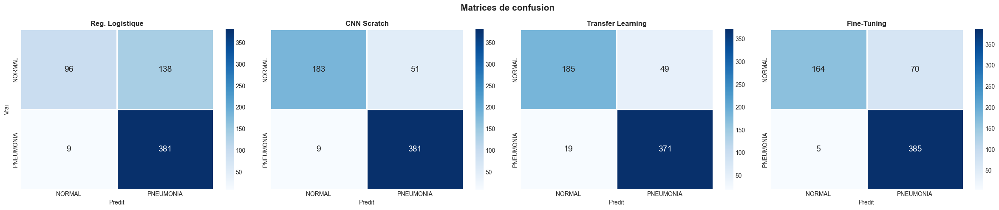

In [32]:
# ============================================================
# MATRICES DE CONFUSION COTE A COTE
# ============================================================
fig, axes = plt.subplots(1, 4, figsize=(24, 5))

for ax, (yt, yp, title) in zip(axes, [
    (y_test_ml, y_pred_test, 'Reg. Logistique'), (y_true_cnn, y_pred_cnn, 'CNN Scratch'),
    (y_true_tl, y_pred_tl, 'Transfer Learning'), (y_true_ft, y_pred_ft, 'Fine-Tuning'),
]):
    cm = confusion_matrix(yt, yp)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=CLASSES, yticklabels=CLASSES,
                ax=ax, annot_kws={"size": 14}, linewidths=1, linecolor='white')
    ax.set_title(title, fontweight='bold')
    ax.set_xlabel('Predit')
    ax.set_ylabel('Vrai' if ax == axes[0] else '')

plt.suptitle('Matrices de confusion', fontsize=15, fontweight='bold')
plt.tight_layout()
plt.show()


In [ ]:
# ============================================================
# SAUVEGARDE FINALE
# ============================================================
MODEL_PATH = "pneumonia_detector_finetuned.keras"
tl_model.save(MODEL_PATH)
print(f"Modele final : {MODEL_PATH} ({os.path.getsize(MODEL_PATH) / (1024*1024):.1f} MB)")
print(f"\nModeles intermediaires dans models/ :")
for f in sorted(os.listdir("models")):
    fpath = os.path.join("models", f)
    print(f"   {f} ({os.path.getsize(fpath) / (1024*1024):.1f} MB)")


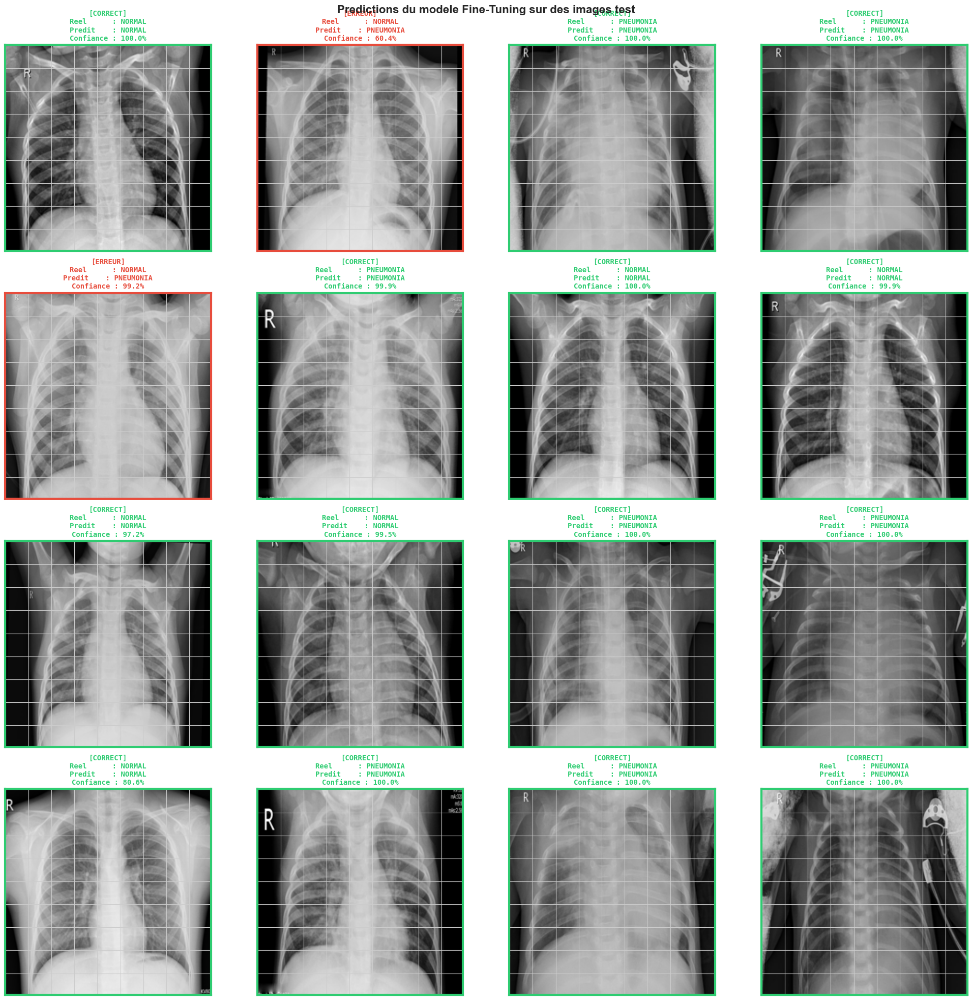

Bilan : 14/16 predictions correctes


In [33]:
# ============================================================
# FONCTION DE PREDICTION
# ============================================================
def predict_image(img_path, model=tl_model, img_size=IMG_SIZE):
    img = keras_image.load_img(img_path, target_size=(img_size, img_size))
    img_array = keras_image.img_to_array(img) / 255.0
    img_batch = np.expand_dims(img_array, axis=0)
    proba = model.predict(img_batch, verbose=0)[0][0]
    pred_class = 'PNEUMONIA' if proba > 0.5 else 'NORMAL'
    confidence = proba if proba > 0.5 else (1 - proba)
    return {'classe': pred_class, 'proba_pneumonia': float(proba), 'confiance': float(confidence)}

# ============================================================
# PREDICTIONS SUR UN ECHANTILLON DU TEST SET
# ============================================================
n_samples_per_class = 8
sample_paths, sample_true_labels = [], []

for cls in CLASSES:
    cls_dir = os.path.join(TEST_DIR, cls)
    all_files = list_image_files(cls_dir)
    selected = random.sample(all_files, min(n_samples_per_class, len(all_files)))
    for fname in selected:
        sample_paths.append(os.path.join(cls_dir, fname))
        sample_true_labels.append(cls)

combined = list(zip(sample_paths, sample_true_labels))
random.shuffle(combined)
sample_paths, sample_true_labels = zip(*combined)

fig, axes = plt.subplots(4, 4, figsize=(20, 20))

for i, ax in enumerate(axes.flatten()):
    if i >= len(sample_paths):
        ax.axis('off')
        continue
    
    img_path = sample_paths[i]
    true_label = sample_true_labels[i]
    result = predict_image(img_path)
    
    img = Image.open(img_path).convert('RGB').resize((IMG_SIZE, IMG_SIZE))
    ax.imshow(img, cmap='gray')
    
    is_correct = result['classe'] == true_label
    border_color = '#2ecc71' if is_correct else '#e74c3c'
    status = "CORRECT" if is_correct else "ERREUR"
    
    ax.set_title(
        f"[{status}]\n"
        f"Reel      : {true_label}\n"
        f"Predit    : {result['classe']}\n"
        f"Confiance : {result['confiance']:.1%}",
        fontsize=10, fontweight='bold', color=border_color, family='monospace'
    )
    for spine in ax.spines.values():
        spine.set_edgecolor(border_color)
        spine.set_linewidth(3)
    ax.tick_params(left=False, bottom=False, labelleft=False, labelbottom=False)

plt.suptitle('Predictions du modele Fine-Tuning sur des images test', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

n_correct = sum(1 for i in range(len(sample_paths)) if predict_image(sample_paths[i])['classe'] == sample_true_labels[i])
print(f"Bilan : {n_correct}/{len(sample_paths)} predictions correctes")


Analyse des erreurs sur l'ensemble du test set...

Nombre total d'erreurs : 75
   Faux Negatifs (PNEUMONIA predit NORMAL) : 5
   Faux Positifs (NORMAL predit PNEUMONIA)  : 70


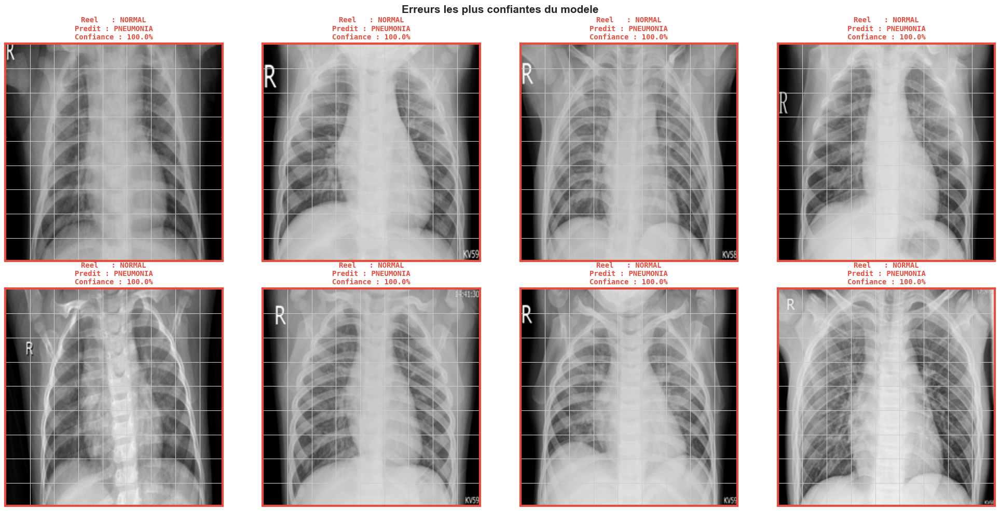


Ces erreurs a haute confiance sont les cas les plus difficiles.
En pratique clinique, un second avis humain reste indispensable.


In [34]:
# ============================================================
# ZOOM SUR LES ERREURS DU MODELE
# ============================================================
print("Analyse des erreurs sur l'ensemble du test set...\n")

error_paths, error_true, error_pred, error_conf = [], [], [], []

for cls in CLASSES:
    cls_dir = os.path.join(TEST_DIR, cls)
    for fname in list_image_files(cls_dir):
        fpath = os.path.join(cls_dir, fname)
        result = predict_image(fpath)
        if result['classe'] != cls:
            error_paths.append(fpath)
            error_true.append(cls)
            error_pred.append(result['classe'])
            error_conf.append(result['confiance'])

print(f"Nombre total d'erreurs : {len(error_paths)}")
print(f"   Faux Negatifs (PNEUMONIA predit NORMAL) : {sum(1 for t,p in zip(error_true, error_pred) if t=='PNEUMONIA' and p=='NORMAL')}")
print(f"   Faux Positifs (NORMAL predit PNEUMONIA)  : {sum(1 for t,p in zip(error_true, error_pred) if t=='NORMAL' and p=='PNEUMONIA')}")

if len(error_paths) > 0:
    sorted_idx = np.argsort(error_conf)[::-1]
    n_show = min(8, len(error_paths))
    
    fig, axes = plt.subplots(2, 4, figsize=(20, 10))
    for i, ax in enumerate(axes.flatten()):
        if i >= n_show:
            ax.axis('off')
            continue
        idx = sorted_idx[i]
        img = Image.open(error_paths[idx]).convert('RGB').resize((IMG_SIZE, IMG_SIZE))
        ax.imshow(img, cmap='gray')
        ax.set_title(
            f"Reel   : {error_true[idx]}\nPredit : {error_pred[idx]}\nConfiance : {error_conf[idx]:.1%}",
            fontsize=10, fontweight='bold', color='#e74c3c', family='monospace'
        )
        for spine in ax.spines.values():
            spine.set_edgecolor('#e74c3c')
            spine.set_linewidth(3)
        ax.tick_params(left=False, bottom=False, labelleft=False, labelbottom=False)
    
    plt.suptitle('Erreurs les plus confiantes du modele', fontsize=15, fontweight='bold')
    plt.tight_layout()
    plt.show()
    
    print("\nCes erreurs a haute confiance sont les cas les plus difficiles.")
    print("En pratique clinique, un second avis humain reste indispensable.")


## G.4 — Conclusions

### Progression

```
Reg. Logistique  -->  CNN Scratch  -->  Transfer Learning  -->  Fine-Tuning
   (baseline)         (mieux)           (encore mieux)         (le meilleur)
```

### Recapitulatif

| Partie | Concept | Ce qu'on a fait |
|--------|---------|----------------|
| **B** | Preparation | Grayscale, resize, normalisation, CLAHE, filtrage, augmentation |
| **C** | ML classique | Regression logistique + PCA |
| **D** | CNN | 4 blocs Conv + BatchNorm + Dropout |
| **E** | Transfer Learning | MobileNetV2 gele |
| **F** | Fine-Tuning | Degel 30% dernieres couches, lr=1e-5 |
| **G** | Evaluation | Accuracy, Precision, Recall, F1, AUC, Confusion Matrix |

### En medecine, le Recall est prioritaire

- **Faux Negatif** = pneumonie ratee = patient non traite = **DANGER**
- **Faux Positif** = fausse alerte = examens supplementaires = moins grave

### Pour aller plus loin

1. **Streamlit App** : interface web d'upload
2. **Grad-CAM** : visualiser ou regarde le modele
3. **EfficientNet / ResNet** : tester d'autres backbones
4. **Multiclasse** : bacterienne vs virale



*Projet pedagogique. Ce modele n'est PAS un dispositif medical certifie.*
